In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dropout, Flatten, Activation, MaxPooling2D, Dense, BatchNormalization
from matplotlib import pyplot as plt
from matplotlib import image as mimg
from tensorflow.keras.preprocessing import image as img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import os
import numpy as np
import cv2
import sklearn
from sklearn.model_selection import train_test_split

In [4]:
# !unzip with_mask.zip
# !unzip without_mask.zip
!unzip Dataset.zip

Archive:  Dataset.zip
   creating: Dataset/
   creating: Dataset/without_mask/
  inflating: Dataset/without_mask/0.jpg  
  inflating: Dataset/without_mask/1.jpg  
  inflating: Dataset/without_mask/10.jpg  
  inflating: Dataset/without_mask/100.jpg  
  inflating: Dataset/without_mask/1000.jpg  
  inflating: Dataset/without_mask/101.jpg  
  inflating: Dataset/without_mask/102.jpg  
  inflating: Dataset/without_mask/103.jpg  
  inflating: Dataset/without_mask/104.jpg  
  inflating: Dataset/without_mask/105.jpg  
  inflating: Dataset/without_mask/106.jpg  
  inflating: Dataset/without_mask/107.jpg  
  inflating: Dataset/without_mask/108.jpg  
  inflating: Dataset/without_mask/109.jpg  
  inflating: Dataset/without_mask/11.jpg  
  inflating: Dataset/without_mask/110.jpg  
  inflating: Dataset/without_mask/111.jpg  
  inflating: Dataset/without_mask/112.jpg  
  inflating: Dataset/without_mask/113.jpg  
  inflating: Dataset/without_mask/114.jpg  
  inflating: Dataset/without_mask/115.jpg  
  

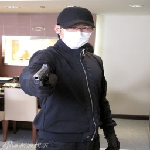

In [9]:
img.load_img('Dataset/with_mask/0.jpg',target_size=(150,150))

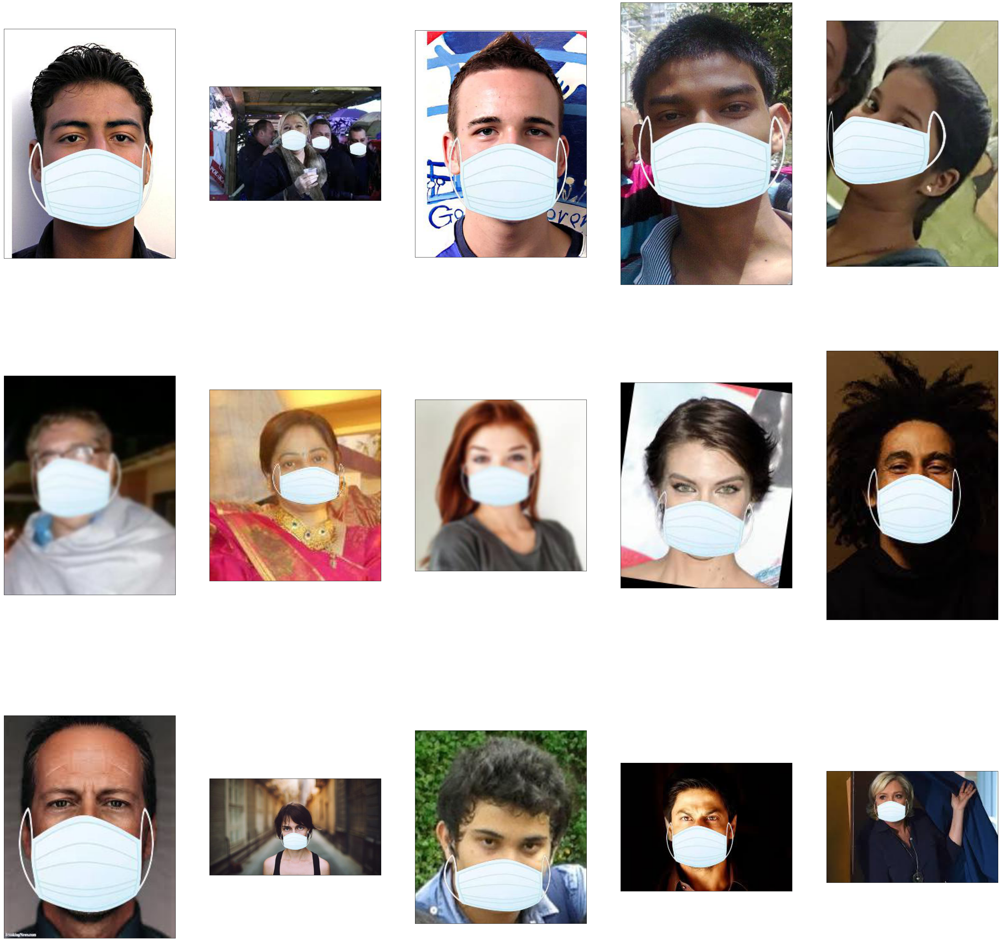

In [ ]:
plt.figure(figsize=(50,50))
counter = 0
for i in os.listdir('data/with_mask'):
  if (counter != 15):
      plt.subplot(3,5,counter+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(img.load_img("data/with_mask/"+i), cmap=plt.cm.binary)
      counter += 1
plt.show()

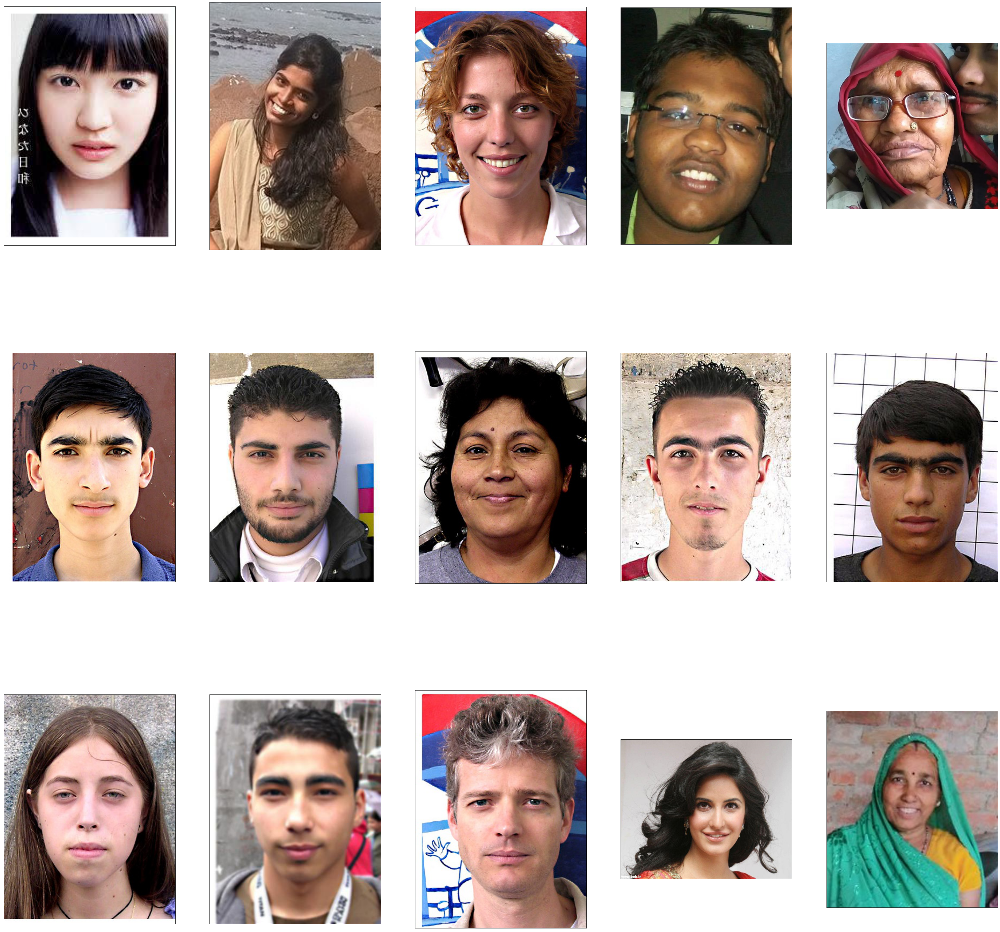

In [ ]:
plt.figure(figsize=(50,50))
counter = 0
for i in os.listdir('data/without_mask'):
  if (counter != 15):
      plt.subplot(3,5,counter+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)
      plt.imshow(img.load_img("data/without_mask/"+i), cmap=plt.cm.binary)
      counter += 1
plt.show()

In [10]:
import tensorflow.keras.backend as k
if k.image_data_format == 'channels_first':
  input_shape = (3,150,150)
else:
  input_shape = (150,150,3)

In [12]:
data = []
target = []
#counter = 0
for f in os.listdir('data/with_mask'):
    f = os.path.join('data/with_mask',f)
#     if (counter == 0):
    actualimg = img.load_img(f)
    imgarray = img.img_to_array(actualimg)
    imgarray = cv2.resize(imgarray,(150,150))
#         print(imgarray.dtype)
#         print(imgarray.shape)
#         print(type(imgarray))
    imgarray = imgarray / 255.0
    data.append(imgarray)
    target.append(np.float32(0.0))
#         counter += 1
for f in os.listdir('data/without_mask'):
    f = os.path.join('data/without_mask',f)
#     if (counter == 0):
    actualimg = img.load_img(f)
    imgarray = img.img_to_array(actualimg)
    imgarray = cv2.resize(imgarray,(150,150))
#         print(imgarray.dtype)
#         print(imgarray.shape)
#         print(type(imgarray))
    imgarray = imgarray / 255.0
    data.append(imgarray)
    target.append(np.float32(1.0))

In [13]:
data = np.array(data)
target = np.array(target)
print("Target")
print(type(target))
print(target.shape)
print(target.dtype)
print("Data")
print(type(data))
print(data.shape)
print(data.dtype)

Target
<class 'numpy.ndarray'>
(1376,)
float32
Data
<class 'numpy.ndarray'>
(1376, 150, 150, 3)
float32


In [ ]:
##UNCOMMENT IF using softmax activation function in output layer and change loss to categorical_entropy in compile
#target = tf.keras.utils.to_categorical(target)

In [ ]:
#target

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]], dtype=float32)

In [14]:
trainX, testX, trainY, testY = train_test_split(data, target, test_size=0.2)

In [15]:
print("TRAINING DATA")
print(type(trainX))
print(trainX.dtype)
print(trainX.shape)
print("TRAINING TARGET")
print(type(trainY))
print(trainY.dtype)
print(trainY.shape)
print("TESTING DATA")
print(type(testX))
print(testX.dtype)
print(testX.shape)
print("TESTING TARGET")
print(type(testY))
print(testY.dtype)
print(testY.shape)


TRAINING DATA
<class 'numpy.ndarray'>
float32
(1100, 150, 150, 3)
TRAINING TARGET
<class 'numpy.ndarray'>
float32
(1100,)
TESTING DATA
<class 'numpy.ndarray'>
float32
(276, 150, 150, 3)
TESTING TARGET
<class 'numpy.ndarray'>
float32
(276,)


In [ ]:
print(trainY)

[1. 1. 0. ... 0. 1. 1.]


In [16]:
class_names = ['with_mask','without_mask']

In [ ]:
# plt.figure(figsize=(12,12))
# for i in range(0, 6):
#   plt.subplot(3,3, i + 1)
#   plt.imshow(img.array_to_img(train[0][0][i]))
#   plt.xlabel(class_names[int(train[0][1][i])])
# plt.tight_layout()
# plt.show()

In [ ]:
# plt.figure(figsize=(12,12))
# for i in range(0, 6):
#   plt.subplot(3,3, i + 1)
#   plt.imshow(img.array_to_img(val[0][0][i]))
#   plt.xlabel(class_names[int(val[0][1][i])])
# plt.tight_layout()
# plt.show()

In [108]:
model0 = []

In [109]:
model0 = Sequential()

In [110]:
##CONFIGURATION 3
model0.add(Conv2D(128,(3,3),activation='relu',input_shape=input_shape))
model0.add(MaxPooling2D((2,2)))
model0.add(Conv2D(64,(3,3),activation='relu'))
model0.add(MaxPooling2D((2,2)))
model0.add(Flatten())
model0.add(Dropout(0.5))
model0.add(Dense(50,activation='relu'))
model0.add(Dense(1,activation='sigmoid'))

##CONFIGURATION 4
# model0.add(Conv2D(128,(3,3),activation='relu',input_shape=input_shape))
# model0.add(MaxPooling2D((2,2)))
# model0.add(Conv2D(64,(3,3),activation='relu'))
# model0.add(MaxPooling2D((2,2)))
# model0.add(Flatten())
# model0.add(Dropout(0.5))
# model0.add(Dense(64,activation='relu'))
# model0.add(Dense(1,activation='sigmoid'))

##CONFIGURATION 5
# model0.add(Conv2D(128,(3,3),activation='relu',input_shape=input_shape))
# model0.add(MaxPooling2D((2,2)))
# model0.add(Conv2D(64,(3,3),activation='relu'))
# model0.add(MaxPooling2D((2,2)))
# model0.add(Flatten())
# model0.add(Dropout(0.5))
# model0.add(Dense(25,activation='relu'))
# model0.add(Dense(1,activation='sigmoid'))

In [111]:
model0.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 148, 148, 128)     3584      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 74, 74, 128)       0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 72, 72, 64)        73792     
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 82944)             0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 82944)             0         
_________________________________________________________________
dense_14 (Dense)             (None, 50)               

In [112]:
model0.compile(optimizer=Adam(),loss='binary_crossentropy',metrics=["accuracy"])

In [113]:
trainerhis = model0.fit(trainX,trainY,validation_split=0.2,epochs=10,batch_size=32)

Train on 880 samples, validate on 220 samples
Epoch 1/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.8082 - acc: 0.5284 - val_loss: 0.6563 - val_acc: 0.6409
Epoch 2/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.4607 - acc: 0.7807 - val_loss: 0.2279 - val_acc: 0.9136
Epoch 3/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.1621 - acc: 0.9409 - val_loss: 0.1278 - val_acc: 0.9636
Epoch 4/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.1007 - acc: 0.9648 - val_loss: 0.0859 - val_acc: 0.9636
Epoch 5/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.0652 - acc: 0.9795 - val_loss: 0.1392 - val_acc: 0.9591
Epoch 6/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.0695 - acc: 0.9795 - val_loss: 0.0895 - val_acc: 0.9682
Epoch 7/10
880/880 [==============================] - 2s 2ms/sample - loss: 0.0434 - acc: 0.9864 - val_loss: 0.1137 - val_acc: 0.9636
Epoch 8/10
880/8

Text(0.5, 1.0, 'Accuracy')

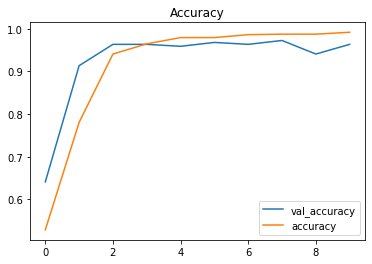

In [114]:
plt.plot(trainerhis.history["val_acc"])
plt.plot(trainerhis.history["acc"])
plt.legend(['val_accuracy','accuracy'])
plt.title('Accuracy')

Text(0.5, 1.0, 'Loss')

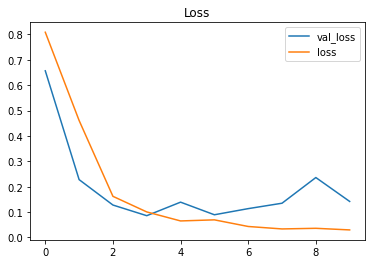

In [115]:
plt.plot(trainerhis.history["val_loss"])
plt.plot(trainerhis.history["loss"])
plt.legend(['val_loss','loss'])
plt.title('Loss')

LINK to download dataset which I used for testing my model by testdatagenerator in below cell https://github.com/TheSSJ2612/Real-Time-Medical-Mask-Detection/releases/download/v0.1/Dataset.zip.

In [ ]:
# testdatagenerator = ImageDataGenerator()
# test = testdatagenerator.flow_from_directory('Dataset',target_size=(150,150),class_mode='binary',classes=['with_mask','without_mask'])

Found 11042 images belonging to 2 classes.


In [116]:
model0.evaluate(testX,testY)

276/276 [==============================] - 0s 707us/sample - loss: 0.0743 - acc: 0.9855


[0.07430364425712521, 0.98550725]

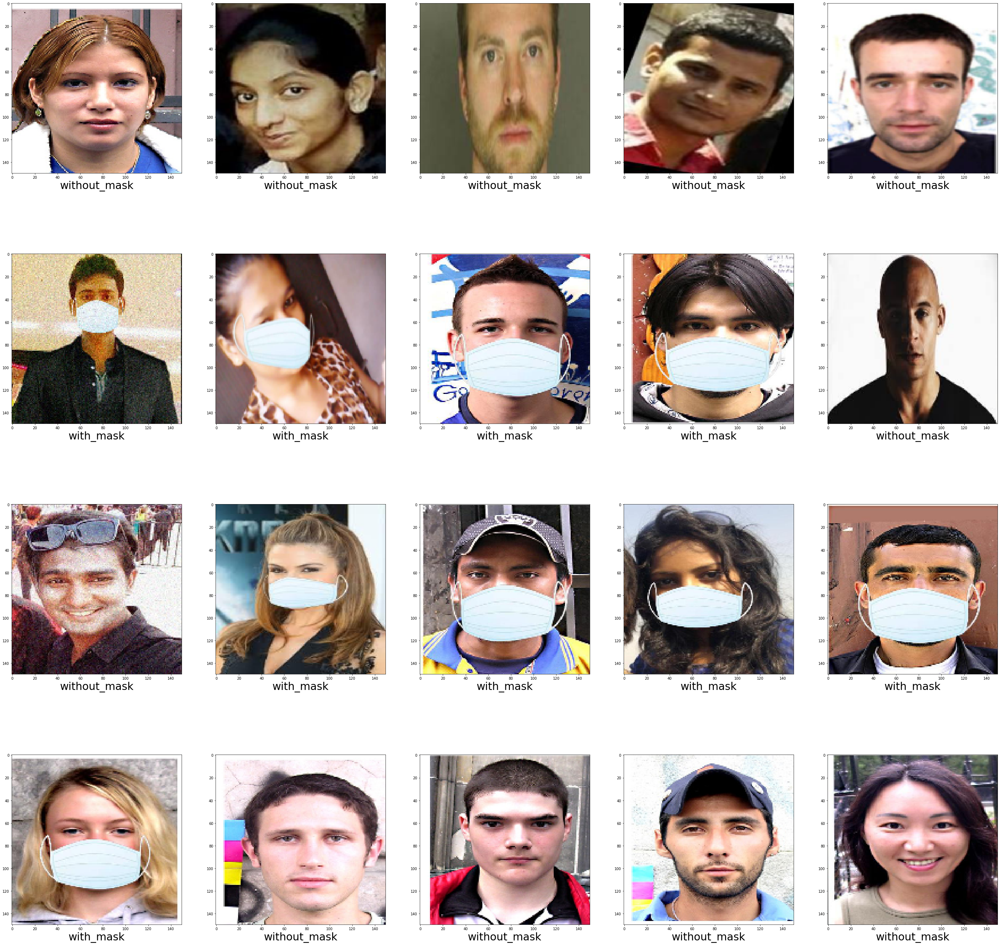

In [106]:
plt.figure(figsize=(50,50))
for i in range(0,20):
  plt.subplot(4,5, i+1)
  plt.imshow(testX[i])
  plt.xlabel(class_names[int(model0.predict_classes(testX)[i])],fontsize=30)

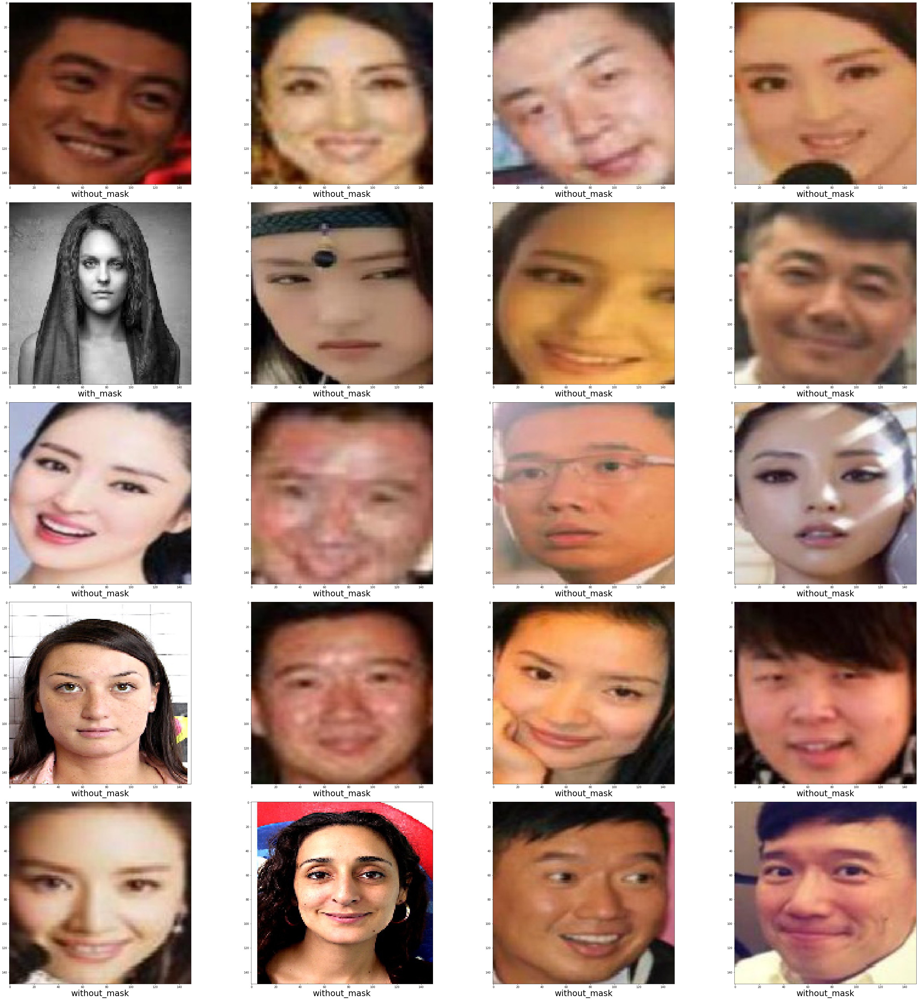

In [92]:
counter = 0
plt.figure(figsize=(50,50))
import numpy as np
for i in os.listdir('Dataset/without_mask'):
    if (counter != 20):
      img_pred = img.load_img('Dataset/without_mask/'+i,target_size=(150,150))
      showimage = img_pred
      img_pred = img.img_to_array(img_pred)
      img_pred = np.expand_dims(img_pred,axis=0)
      rslt = model0.predict_classes(img_pred)
      #print(rslt[0][0])
      #if (rslt[0][0] == 1.0):
      plt.subplot(5,4,counter+1)
      plt.imshow(showimage)
      plt.xlabel(class_names[int(rslt)],fontsize=30)
      counter += 1
plt.tight_layout()

[[0]]
[[0]]
[[0]]
[[0]]
[[0]]
[[0]]
[[1]]
[[0]]
[[1]]
[[0]]
[[1]]
[[0]]
[[0]]
[[0]]
[[0]]
[[0]]
[[0]]
[[0]]
[[1]]
[[0]]


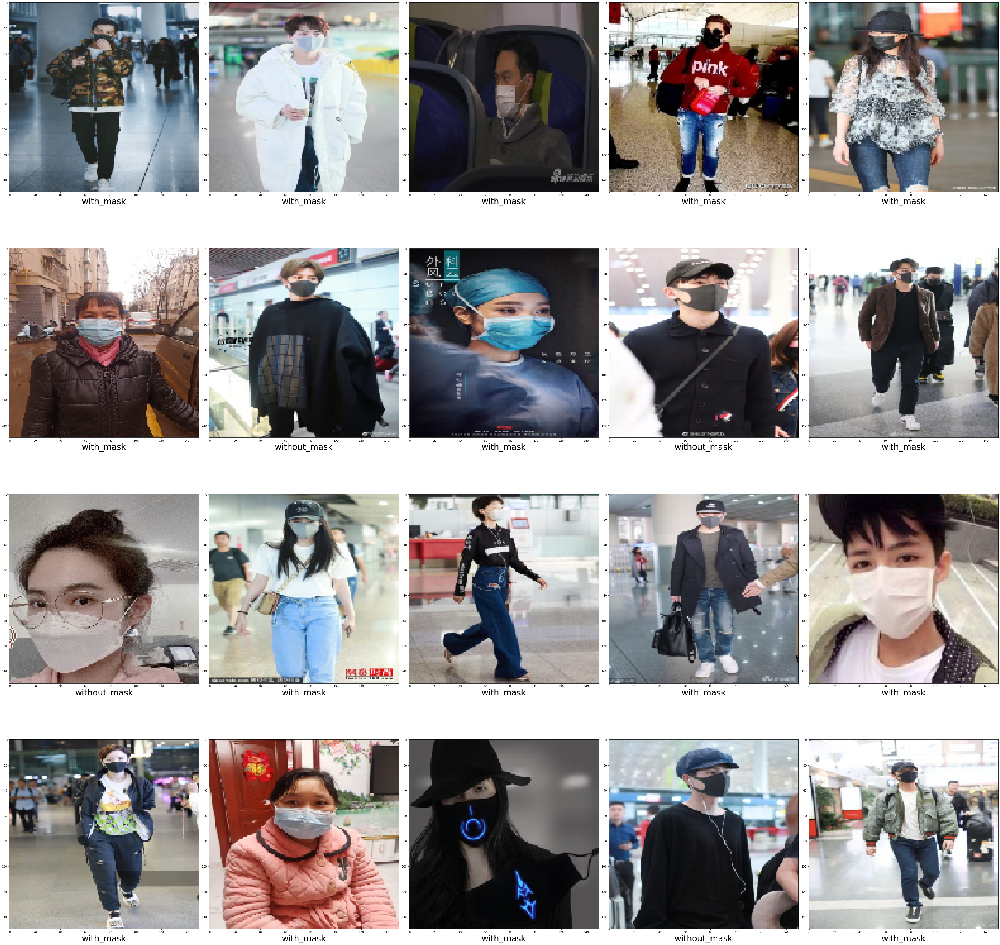

In [117]:
counter = 0
plt.figure(figsize=(50,50))
import numpy as np
for i in os.listdir('Dataset/with_mask'):
    if (counter != 20):
      img_pred = img.load_img('Dataset/with_mask/'+i,target_size=(150,150))
      showimage = img_pred
      img_pred = img.img_to_array(img_pred)
      img_pred = np.expand_dims(img_pred,axis=0)
      rslt = model0.predict_classes(img_pred)
      print(rslt)
      #if (rslt[0][0] == 1.0):
      plt.subplot(4,5,counter+1)
      plt.imshow(showimage)
      plt.xlabel(class_names[int(rslt)],fontsize=30)
      counter += 1
plt.tight_layout()

In [74]:
model0.save('model_weight_approach4_facemask.h5')

In [75]:
model0json = model0.to_json()

In [76]:
with open("model_approach4_mask.json","w") as json_file:
    json_file.write(model0json)